In [1]:
import warnings
warnings.filterwarnings('ignore')

import os
os.environ['PROJ_LIB']='/home/jhemedinger/anaconda3/envs/precip_env/share/proj/'
import numpy as np
import pyart, boto3, tempfile, shutil, datetime
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import animation
from botocore.handlers import disable_signing
from tint import Cell_tracks
from tint import animate as tint_animate
from tint.visualization import embed_mp4_as_gif
from glob import glob


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [2]:
def nearest(items, pivot):
    return min(items, key=lambda x: abs(x - pivot))

def find_my_key(radar_name, desired_date=None, 
                start_time=None, stop_time=None):
    """
    Find the key in Amazon s3 corresponding to a particular radar site and 
    datetime
    
    Parameters
    ----------
    radar_name : str
        Four letter radar name
    desired_datetime : datetime
        The date time desired
    Returns
    -------
    my_key : string
        string matching the key for the radar file on AWS s3
    """
    
    #creating a bucket and a client to be able to pull data from AWS and setting 
    #it as unsigned
    bucket = 'noaa-nexrad-level2'
    s3 = boto3.resource('s3')
    s3.meta.client.meta.events.register('choose-signer.s3.*', disable_signing)
    #connects the bucket created above with radar data
    aws_radar = s3.Bucket(bucket)
    
    
    if desired_date is not None:
        target_string = desired_date + '/' + radar_name
    else:
        target_string = datetime.datetime.utcnow().strftime('%Y/%m/%d/'+radar_name)
        
    my_list_of_keys = [this_object.key for this_object in aws_radar.objects.filter(Prefix=target_string)]
    my_list_of_datetimes = []
    for obj in aws_radar.objects.filter(Prefix=target_string):
        try:
            my_list_of_datetimes.append(datetime.datetime.strptime(obj.key[20:35], '%Y%m%d_%H%M%S'))
        except ValueError:
            pass #usually a tar file left in the bucket
        
    start_datetime = datetime.datetime.strptime(start_time, '%Y%m%d_%H%M%S')
    stop_datetime = datetime.datetime.strptime(stop_time, '%Y%m%d_%H%M%S')
    start_index = my_list_of_datetimes.index(nearest(my_list_of_datetimes, start_datetime))
    stop_index = my_list_of_datetimes.index(nearest(my_list_of_datetimes, stop_datetime))
    
    keys = my_list_of_keys[start_index:stop_index]
    return aws_radar, keys

In [3]:
aws_radar, keys = find_my_key('KVNX', '2018/06/23', 
                              '20180623_053000', '20180623_180000')

In [4]:
keys = keys[0:11]

In [13]:
keys

['2018/06/23/KVNX/KVNX20180623_053207_V06',
 '2018/06/23/KVNX/KVNX20180623_053757_V06',
 '2018/06/23/KVNX/KVNX20180623_054346_V06',
 '2018/06/23/KVNX/KVNX20180623_054937_V06',
 '2018/06/23/KVNX/KVNX20180623_055527_V06',
 '2018/06/23/KVNX/KVNX20180623_060118_V06',
 '2018/06/23/KVNX/KVNX20180623_060708_V06',
 '2018/06/23/KVNX/KVNX20180623_061258_V06',
 '2018/06/23/KVNX/KVNX20180623_061848_V06',
 '2018/06/23/KVNX/KVNX20180623_062437_V06',
 '2018/06/23/KVNX/KVNX20180623_063029_V06']

In [5]:
out_path_dir = '/home/jhemedinger/suli_projects/precipitation-onset/data'

In [ ]:
#creating a radar animation using pyart and matplotlib functions
def animate(nframe):
    plt.clf()
    localfile = tempfile.NamedTemporaryFile()
    aws_radar.download_file(keys[nframe], localfile.name)
    radar = pyart.io.read(localfile.name)
    display = pyart.graph.RadarMapDisplay(radar)
    # Delete radar after use to save memory.
    del radar
    display.plot_ppi_map('reflectivity', sweep=0, resolution='l',
                         vmin=-8, vmax=64,lat_0=41.713969, lon_0=-87.981810,
                         mask_outside=False, fig=fig, width=100000, height=100000, 
                         cmap = pyart.graph.cm.LangRainbow12 )

    display.basemap.drawcounties()
    #display.plot_point(-87.981810, 41.713969 , label_text='ANL', symbol='ko')
fig = plt.figure(figsize=(10, 8))

anim_kvnx = animation.FuncAnimation(fig, animate,
                                    frames=len(keys))
anim_kvnx.save(out_path_dir + '/reflectivity_animation.gif', 
               writer='imagemagick', fps=2)
plt.show()
plt.close()

In [15]:
#turing the data into grid data and saving it to a folder
def get_grid(aws_radar, key):
    localfile = tempfile.NamedTemporaryFile()
    aws_radar.download_file(key, localfile.name)
    radar = pyart.io.read(localfile.name)
    grid = pyart.map.grid_from_radars(radar, grid_shape=(31, 401, 401),
            grid_limits=((0, 15000), (-60000, 60000), (-60000, 60000)),
            grid_origin=(radar.latitude['data'], radar.longitude['data']), 
            fields=['reflectivity'], 
            weighting_function='Barnes', gridding_algo='map_gates_to_grid',
            h_factor=0., nb=0.6, bsp=1., min_radius=200.)
    return grid

for num,key in enumerate(keys):
    print('saving grid', num)
    grid = get_grid(aws_radar, key)
    name = os.path.join('grid_' + str(num).zfill(3) + '.nc')
    pyart.io.write_grid(name, grid)
    del grid

saving grid 0
saving grid 1
saving grid 2
saving grid 3
saving grid 4
saving grid 5
saving grid 6
saving grid 7
saving grid 8
saving grid 9
saving grid 10


In [16]:
#reading in the gridded data to be used with TINT
files = glob('grid_*')
files.sort()

In [17]:
#creating a grid generator to be able to read the grids into TINT
grid_gen = (pyart.io.read_grid(f) for f in files)

In [18]:
#creating the cell tracks and changing the minimum threshold value for reflectivity
tracks_obj = Cell_tracks()
tracks_obj.params['FIELD_THRESH']=35

In [19]:
tracks_obj.get_tracks(grid_gen)

Writing tracks for scan 0
Writing tracks for scan 1
Writing tracks for scan 2
Writing tracks for scan 3
Writing tracks for scan 4
Writing tracks for scan 5
Writing tracks for scan 6
Writing tracks for scan 7
Writing tracks for scan 8
Writing tracks for scan 9
Writing tracks for scan 10


time elapsed 0.0 minutes


In [20]:
tracks_obj.tracks

time   grid_x   grid_y      lon      lat    area  \
scan uid                                                                   
0    0   2018-06-23 05:32:07   29.806   15.486 -98.6964  36.2401   95.76   
     1   2018-06-23 05:32:07   86.502   22.054 -98.5058  36.2598   20.07   
     2   2018-06-23 05:32:07   39.633   82.624 -98.6642  36.4237  227.34   
     3   2018-06-23 05:32:07   52.090  144.743 -98.6250  36.5912   27.00   
     4   2018-06-23 05:32:07  333.653  137.507 -97.6776  36.5725   12.96   
1    1   2018-06-23 05:37:57  108.972   13.206 -98.4321  36.2357   29.25   
     2   2018-06-23 05:37:57   66.022   57.069 -98.5766  36.3540  144.27   
     5   2018-06-23 05:37:57    5.382   50.277 -98.7808  36.3341   37.71   
     6   2018-06-23 05:37:57   81.595   97.595 -98.5236  36.4648   17.10   
     3   2018-06-23 05:37:57   66.416  120.372 -98.5776  36.5239   28.80   
     7   2018-06-23 05:37:57    6.479  127.698 -98.7792  36.5446    8.64   
     4   2018-06-23 05:37:57  327.356  135.032 -97.7011  36.5645   19.71   
     8   2018-06-23 05:37:57  311.200  144.530 -97.7547  36.5916    9.00   
2    2   2018-06-23 05:43:46  101.266   53.528 -98.4593  36.3463  116.55   
     5   2018-06-23 05:43:46   10.175   42.150 -98.7639  36.3126   43.20   
     9   2018-06-23 05:43:46   42.505   60.683 -98.6537  36.3644    9.09   
     7   2018-06-23 05:43:46   12.561  106.493 -98.7552  36.4854   65.16   
     3   2018-06-23 05:43:46   79.742   96.361 -98.5303  36.4593   17.46   
     10  2018-06-23 05:43:46  106.504  138.786 -98.4402  36.5756   10.53   
     4   2018-06-23 05:43:46  323.226  134.317 -97.7146  36.5618   14.76   
     8   2018-06-23 05:43:46  313.580  144.260 -97.7447  36.5889    9.00   
     11  2018-06-23 05:43:46  391.608  268.627 -97.4797  36.9250   13.77   
3    12  2018-06-23 05:49:37    6.176    7.673 -98.7765  36.2208   17.91   
     5   2018-06-23 05:49:37   14.093   40.890 -98.7505  36.3100   15.48   
     7   2018-06-23 05:49:37   21.738   78.068 -98.7244  36.4100  127.26   
     2   2018-06-23 05:49:37  122.537   68.873 -98.3858  36.3869   21.96   
     3   2018-06-23 05:49:37   99.069   81.078 -98.4663  36.4191   20.88   
     4   2018-06-23 05:49:37  326.759  134.799 -97.7011  36.5645   17.91   
     8   2018-06-23 05:49:37  313.102  144.255 -97.7480  36.5889    8.82   
     11  2018-06-23 05:49:37  388.458  267.028 -97.4933  36.9197   25.74   
...                      ...      ...      ...      ...      ...     ...   
6    3   2018-06-23 06:07:08  189.465   45.977 -98.1646  36.3251   19.35   
     15  2018-06-23 06:07:08  152.895   43.580 -98.2851  36.3196   16.29   
     17  2018-06-23 06:07:08   93.163   48.880 -98.4861  36.3327    8.28   
     4   2018-06-23 06:07:08  324.995  134.709 -97.7078  36.5645   18.27   
     8   2018-06-23 06:07:08  311.634  144.624 -97.7514  36.5916    8.37   
     11  2018-06-23 06:07:08  390.205  263.940 -97.4866  36.9116   29.79   
     14  2018-06-23 06:07:08  341.462  278.936 -97.6517  36.9528   29.43   
7    18  2018-06-23 06:12:58   69.621    2.942 -98.5624  36.2083    9.27   
     7   2018-06-23 06:12:58   62.637   51.523 -98.5866  36.3404  421.74   
     19  2018-06-23 06:12:58  143.752    8.628 -98.3150  36.2252   10.17   
     20  2018-06-23 06:12:58   70.757  107.994 -98.5606  36.4916   15.93   
     21  2018-06-23 06:12:58  135.894  111.055 -98.3425  36.5003   19.53   
     4   2018-06-23 06:12:58  327.872  135.101 -97.6978  36.5645   23.22   
     8   2018-06-23 06:12:58  312.661  144.226 -97.7480  36.5889   11.16   
     11  2018-06-23 06:12:58  388.713  267.022 -97.4899  36.9197   24.75   
     14  2018-06-23 06:12:58  345.930  277.016 -97.6348  36.9473   16.74   
8    7   2018-06-23 06:18:48   98.497   30.336 -98.4691  36.2815  191.34   
     22  2018-06-23 06:18:48   35.427   90.621 -98.6811  36.4453   55.80   
     23  2018-06-23 06:18:48   68.641   89.728 -98.5671  36.4430    8.28   
     4   2018-06-23 06:18:48  332.490  137.585 -97.6843  36.5725   35.82

In [21]:
if os.path.exists(out_path_dir + '/tracks_animation.mp4'):
    print(out_path_dir + '/tracks_animation.mp4'
          + ' already exists, removing file')
    os.remove(out_path_dir + '/tracks_animation.mp4')

/home/jhemedinger/suli_projects/precipitation-onset/data/tracks_animation.mp4 already exists, removing file


In [22]:
grid_gen = (pyart.io.read_grid(f) for f in files)
tint_animate(tracks_obj, grid_gen, os.path.join(out_path_dir + '/tracks_animation'), tracers=True, 
             cmap=pyart.graph.cm_colorblind.HomeyerRainbow)#, lat_lines=lat_lines, lon_lines=lon_lines)

Animating 11 frames
Frame: 0
Frame: 1
Frame: 2
Frame: 3
Frame: 4
Frame: 5
Frame: 6
Frame: 7
Frame: 8
Frame: 9
Frame: 10


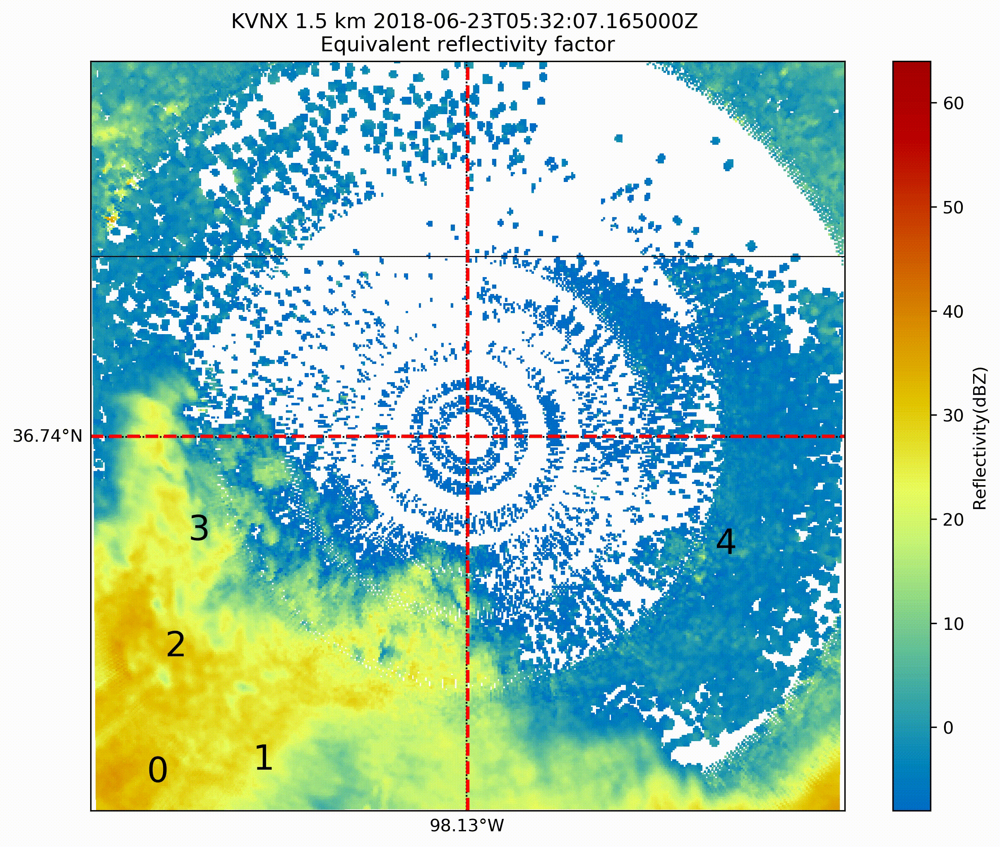

In [23]:
embed_mp4_as_gif(out_path_dir + '/tracks_animation.mp4')